In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
from astropy.time import Time, TimeDelta
import datetime
plt.style.use('default')
plt.style.use(['science', 'notebook'])
import glob
import os
import re
import pytz

In [2]:
mod_vis_full = np.load("/home/casm/software/casm_xengine/scripts/advait/vis-sim/results_20251218_2100_to_20251220_2300/casm_visibilities_20251218_2100_to_20251220_2300.npz")

In [3]:
# Unpack all data from the NPZ file
mod_vis = mod_vis_full['visibilities']
mod_times = mod_vis_full['times']
baseline_pairs = mod_vis_full['baseline_pairs']
baseline_vecs = mod_vis_full['baselines']  
mod_freqs = mod_vis_full['frequencies']
src_alts = mod_vis_full['source_alt']  
src_azs = mod_vis_full['source_az']  
source_names = mod_vis_full['source_names']
antenna_positions = mod_vis_full['antenna_positions']
uvw_coords = mod_vis_full['uvw']
# Additional antenna mapping data
n_antennas = mod_vis_full['n_antennas']
n_pol = mod_vis_full['n_pol']
array_shape = mod_vis_full['array_shape']
array_dimensions = mod_vis_full['array_dimensions']
antenna_ids = mod_vis_full['antenna_ids']
row_indices = mod_vis_full['row_indices']
col_indices = mod_vis_full['col_indices']

In [4]:
obs_vis = np.load("/home/casm/software/casm_xengine/scripts/advait/2025-12-17-23:32:35_vis_combined.npy")
obs_freqs = np.linspace(375,468,3072)
pst = pytz.timezone('US/Pacific')
samp_time = 8.589934592
dt = 16 * samp_time
obs_del_ts = np.arange(obs_vis.shape[0]) * dt

In [5]:
pst = pytz.timezone('US/Pacific')
t_naive = datetime.datetime(2025, 12, 18, 21, 0, 22, 0) # start timestamp in observed data
t0 = pst.localize(t_naive)

In [6]:
t0


datetime.datetime(2025, 12, 18, 21, 0, 22, tzinfo=<DstTzInfo 'US/Pacific' PST-1 day, 16:00:00 STD>)

In [7]:
mod_times = [datetime.datetime.strptime(time, '%Y-%m-%d %H:%M:%S.%f') for time in mod_times]
utc = pytz.utc
mod_times = np.array([utc.localize(t) for t in mod_times])
# convert to PST
# pst = pytz.timezone('US/Pacific')
mod_times = np.array([t.astimezone(pst) for t in mod_times])

In [8]:
mod_times

array([datetime.datetime(2025, 12, 18, 21, 0, tzinfo=<DstTzInfo 'US/Pacific' PST-1 day, 16:00:00 STD>),
       datetime.datetime(2025, 12, 18, 21, 2, tzinfo=<DstTzInfo 'US/Pacific' PST-1 day, 16:00:00 STD>),
       datetime.datetime(2025, 12, 18, 21, 4, tzinfo=<DstTzInfo 'US/Pacific' PST-1 day, 16:00:00 STD>),
       ...,
       datetime.datetime(2025, 12, 20, 22, 56, tzinfo=<DstTzInfo 'US/Pacific' PST-1 day, 16:00:00 STD>),
       datetime.datetime(2025, 12, 20, 22, 58, tzinfo=<DstTzInfo 'US/Pacific' PST-1 day, 16:00:00 STD>),
       datetime.datetime(2025, 12, 20, 23, 0, tzinfo=<DstTzInfo 'US/Pacific' PST-1 day, 16:00:00 STD>)],
      shape=(1501,), dtype=object)

In [9]:
mod_del_ts = np.array([td.total_seconds() for td in (mod_times - t0)])
mod_del_ts

from scipy.interpolate import interp1d

vis_interpolator = interp1d(
    mod_del_ts, 
    mod_vis,  
    kind='linear', 
    axis=0, 
    fill_value="extrapolate"
)

mod_vis_interp = vis_interpolator(obs_del_ts)

print(f"Original model_vis shape: {mod_vis.shape}")
print(f"Interpolated model_vis shape: {mod_vis_interp.shape}")

vis_interpolator_f = interp1d(
    mod_freqs, 
    mod_vis_interp, 
    kind='linear', 
    axis=2, 
    fill_value="extrapolate"
)

mod_vis_interp = vis_interpolator_f(obs_freqs)
mod_phase_interp = np.angle(mod_vis_interp)

Original model_vis shape: (1501, 36, 100, 2, 2)
Interpolated model_vis shape: (1300, 36, 100, 2, 2)


In [10]:
del mod_vis

In [11]:
baseline_pairs

array([[ 4,  4],
       [ 4,  6],
       [ 4,  7],
       [ 4,  8],
       [ 4,  9],
       [ 4, 10],
       [ 4, 11],
       [ 4, 12],
       [ 6,  6],
       [ 6,  7],
       [ 6,  8],
       [ 6,  9],
       [ 6, 10],
       [ 6, 11],
       [ 6, 12],
       [ 7,  7],
       [ 7,  8],
       [ 7,  9],
       [ 7, 10],
       [ 7, 11],
       [ 7, 12],
       [ 8,  8],
       [ 8,  9],
       [ 8, 10],
       [ 8, 11],
       [ 8, 12],
       [ 9,  9],
       [ 9, 10],
       [ 9, 11],
       [ 9, 12],
       [10, 10],
       [10, 11],
       [10, 12],
       [11, 11],
       [11, 12],
       [12, 12]])

In [12]:
# reorder messy observed baselines to match model order
# 1. Define the indices
model_idx = [4, 6, 7, 8, 9, 10, 11, 12]
obs_idx   = [8, 3, 11, 4, 9, 7, 10, 2]

# 2. Get the grid indices for both source and destination
# We unpack the tuple returned by ix_ into row and column components
r_dest, c_dest = np.ix_(model_idx, model_idx)
r_src, c_src = np.ix_(obs_idx, obs_idx)

# 3. Create the new array
ntime, nfreq = obs_vis.shape[:2]
obs_reordered = np.zeros((ntime, nfreq, 13, 13), dtype=obs_vis.dtype)

# 4. Perform the assignment using the meshes
# This maps the 8x8 obs block into the 13x13 model grid
obs_reordered[:, :, r_dest, c_dest] = obs_vis[:, :, r_src, c_src]

obs_vis = np.copy(obs_reordered)

In [13]:
baseline_pairs

array([[ 4,  4],
       [ 4,  6],
       [ 4,  7],
       [ 4,  8],
       [ 4,  9],
       [ 4, 10],
       [ 4, 11],
       [ 4, 12],
       [ 6,  6],
       [ 6,  7],
       [ 6,  8],
       [ 6,  9],
       [ 6, 10],
       [ 6, 11],
       [ 6, 12],
       [ 7,  7],
       [ 7,  8],
       [ 7,  9],
       [ 7, 10],
       [ 7, 11],
       [ 7, 12],
       [ 8,  8],
       [ 8,  9],
       [ 8, 10],
       [ 8, 11],
       [ 8, 12],
       [ 9,  9],
       [ 9, 10],
       [ 9, 11],
       [ 9, 12],
       [10, 10],
       [10, 11],
       [10, 12],
       [11, 11],
       [11, 12],
       [12, 12]])

Text(0, 0.5, 'Frequency (MHz)')

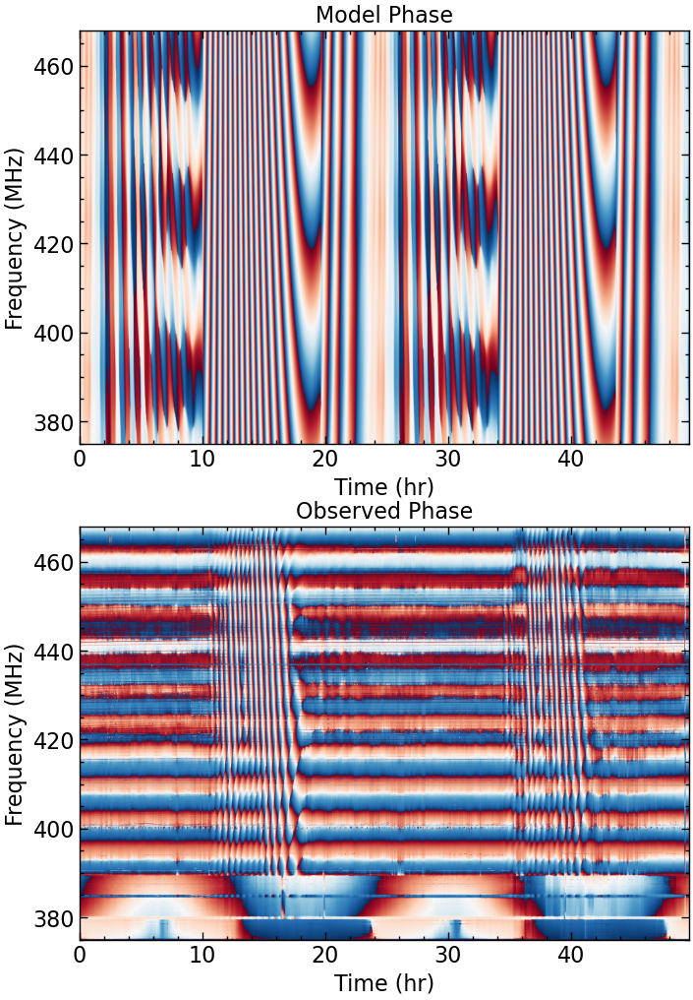

In [14]:
# N - outrigger, 2-12 in model and 8-2 in obs, look at casm_13.csv for model baseline mapping
fig, (ax,ax1) = plt.subplots(2,1,figsize=(8, 12))
test_model_vis = mod_vis_interp[:, 7, :, 0, 0].T
test_obs_vis = obs_vis[:,::-1,4,12].T
model_phase = np.angle(test_model_vis)
im = ax.imshow(
    model_phase, 
    aspect='auto', 
    cmap='RdBu', 
    extent=[obs_del_ts[0]/3600, obs_del_ts[-1]/3600, obs_freqs[0], obs_freqs[-1]], # Flipped y-axis for proper imshow orientation
    vmin=-np.pi,
    vmax=np.pi,
    origin="lower"
)
ax.set_title("Model Phase")
ax.set_xlabel("Time (hr)")
ax.set_ylabel("Frequency (MHz)")

i,j = 8,2
ax1.imshow(np.angle(test_obs_vis), 
            extent=[obs_del_ts[0]/3600, obs_del_ts[-1]/3600, obs_freqs[0], obs_freqs[-1]], 
            aspect = 'auto', 
            cmap = 'RdBu',
            vmin=-np.pi,
            vmax=np.pi,
            origin="lower")
ax1.set_title("Observed Phase")
ax1.set_xlabel("Time (hr)")
ax1.set_ylabel("Frequency (MHz)")

In [15]:
n = 1
test_model_vis = mod_vis_interp[:, n, :, 0, 0].T
test_obs_vis = obs_vis[:,::-1,4,6].T
model_phase = np.angle(test_model_vis)
baseline_pairs[n], baseline_vecs[0,n]

(array([4, 6]), np.float64(0.0))

Text(0, 0.5, 'Frequency (MHz)')

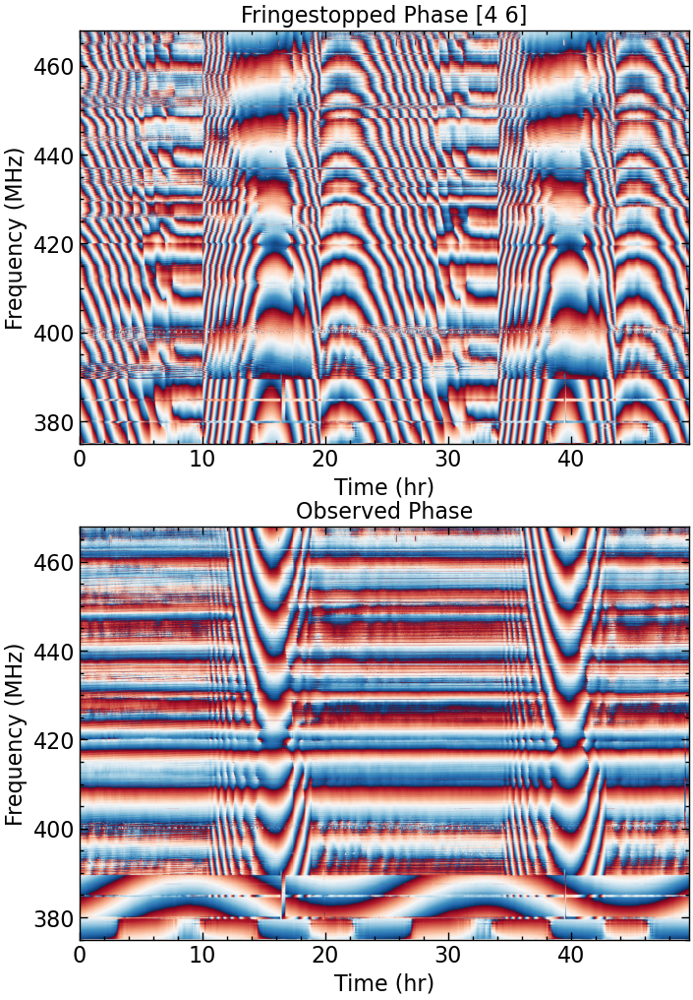

In [16]:

# model_phase_shifted = np.roll(model_phase, shift=n_shift, axis=1)
test_obs_corr = test_obs_vis * np.exp(-1j * model_phase)
fig, (ax,ax1) = plt.subplots(2,1,figsize=(8, 12))
# model_phase = np.angle(test_model_vis)
im = ax.imshow(
    np.angle(test_obs_corr), 
    aspect='auto', 
    cmap='RdBu', 
    extent=[obs_del_ts[0]/3600, obs_del_ts[-1]/3600, obs_freqs[0], obs_freqs[-1]], # Flipped y-axis for proper imshow orientation
    vmin=-np.pi,
    vmax=np.pi,
    origin="lower"
)
ax.set_title(f"Fringestopped Phase {baseline_pairs[n]}")
ax.set_xlabel("Time (hr)")
ax.set_ylabel("Frequency (MHz)")

ax1.imshow(np.angle(test_obs_vis), 
            extent=[obs_del_ts[0]/3600, obs_del_ts[-1]/3600, obs_freqs[0], obs_freqs[-1]], 
            aspect = 'auto', 
            cmap = 'RdBu',
            vmin=-np.pi,
            vmax=np.pi,
            origin="lower")
ax1.set_title("Observed Phase")
ax1.set_xlabel("Time (hr)")
ax1.set_ylabel("Frequency (MHz)")

In [17]:
obs_freqs

array([375.        , 375.0302833 , 375.06056659, ..., 467.93943341,
       467.9697167 , 468.        ], shape=(3072,))

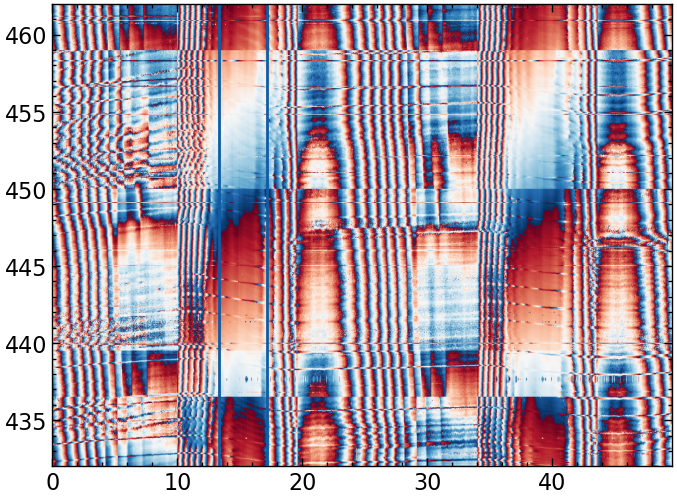

In [18]:
bad_freqs = [[375, 390], [400,402], [409,411], [436, 438], [451,452], [463,465], [467,469], [483,485], [487, 500]
            ,[400,402], [409,411], [442,443], [472,473], [463, 470], [416,425], [425,432], [435,440], [476,482], [458,460], [450,451]]

f_mask = (obs_freqs > 430) & (obs_freqs < 462)
for f in bad_freqs:
    # ax.axhspan(f[0], f[1], color='gray', alpha=0.5)
    f_mask &= ~((obs_freqs >= f[0]) & (obs_freqs <= f[1]))

ts = 200
plt.imshow(
    np.angle(test_obs_corr[f_mask,:]), 
    aspect='auto', 
    cmap='RdBu', 
    extent=[obs_del_ts[0]/3600, obs_del_ts[-1]/3600, obs_freqs[f_mask][0], obs_freqs[f_mask][-1]], # Flipped y-axis for proper imshow orientation
    vmin=-np.pi,
    vmax=np.pi,
    origin="lower"
)
tsun = [350,450]
plt.axvline(obs_del_ts[tsun[0]]/3600)
plt.axvline(obs_del_ts[tsun[1]]/3600)


In [19]:
obs_del_ts[tsun[0]]

np.float64(48103.633715200005)

In [20]:
test_obs_corr.shape

(3072, 1300)

np.float64(-21.353846394433816)

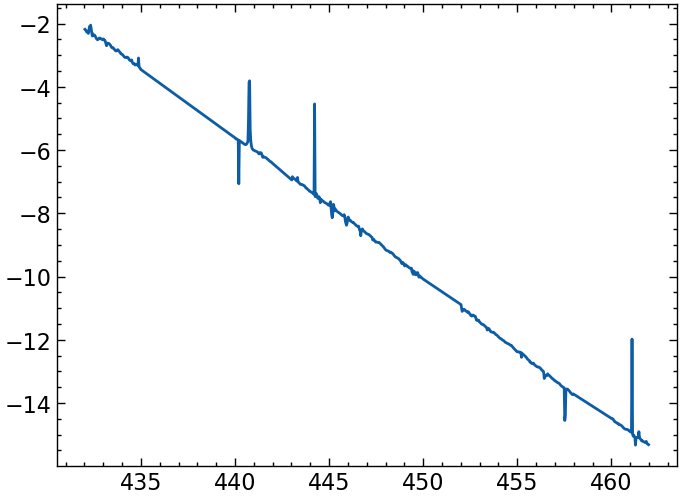

In [21]:
phases = np.unwrap(np.angle(np.mean(test_obs_corr[f_mask,350:450], axis=1)))
plt.plot(obs_freqs[f_mask], phases)
p = np.polyfit(obs_freqs[f_mask]*1e6, phases, 1)
p[0]*3e8/(2*np.pi)

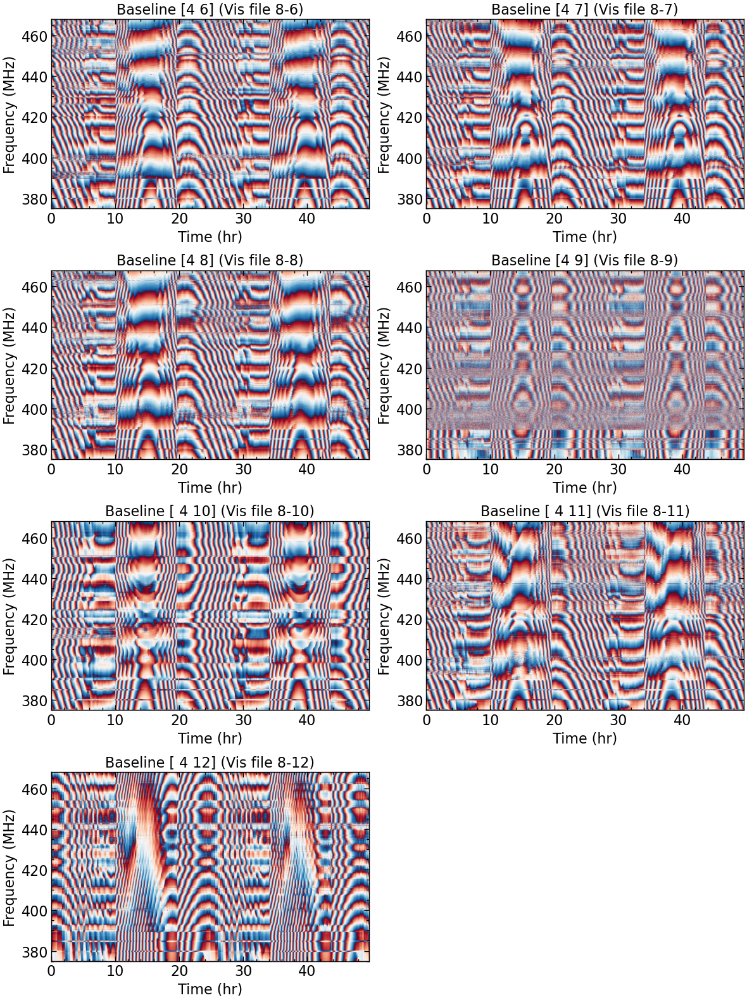

In [22]:
ns = np.arange(1, 8)
ps = [6, 7, 8, 9, 10, 11, 12]

# 1. Increase grid to 4x2 to fit all 7 items
fig, axs = plt.subplots(4, 2, figsize=(12, 16))
axs = axs.flatten()  # Flatten to handle 1D indexing [0, 1, 2, ...]

for i, (n, p) in enumerate(zip(ns, ps)):
    # Data extraction
    test_model_vis = mod_vis_interp[:, n, :, 0, 0].T
    model_phase = np.angle(test_model_vis)
    
    # Obs data - using ant 8 and the loop variable p
    test_obs_vis = obs_vis[:, ::-1, 4, p].T
    
    # Apply fringestopping (Conjugate subtraction)
    test_obs_corr = test_obs_vis * np.exp(-1j * model_phase)
    
    # Plotting using the enumeration index 'i' (0, 1, 2...)
    im = axs[i].imshow(
        np.angle(test_obs_corr), 
        aspect='auto', 
        cmap='RdBu', 
        extent=[obs_del_ts[0]/3600, obs_del_ts[-1]/3600, obs_freqs[0], obs_freqs[-1]], 
        vmin=-np.pi,
        vmax=np.pi,
        origin="lower"
    )
    
    axs[i].set_title(f"Baseline {baseline_pairs[n]} (Vis file 8-{p})")
    axs[i].set_xlabel("Time (hr)")
    axs[i].set_ylabel("Frequency (MHz)")

# 2. Hide the last empty subplot (index 7)
axs[-1].set_visible(False)

plt.tight_layout()
plt.show()
# fig.savefig("fringestopped.png")

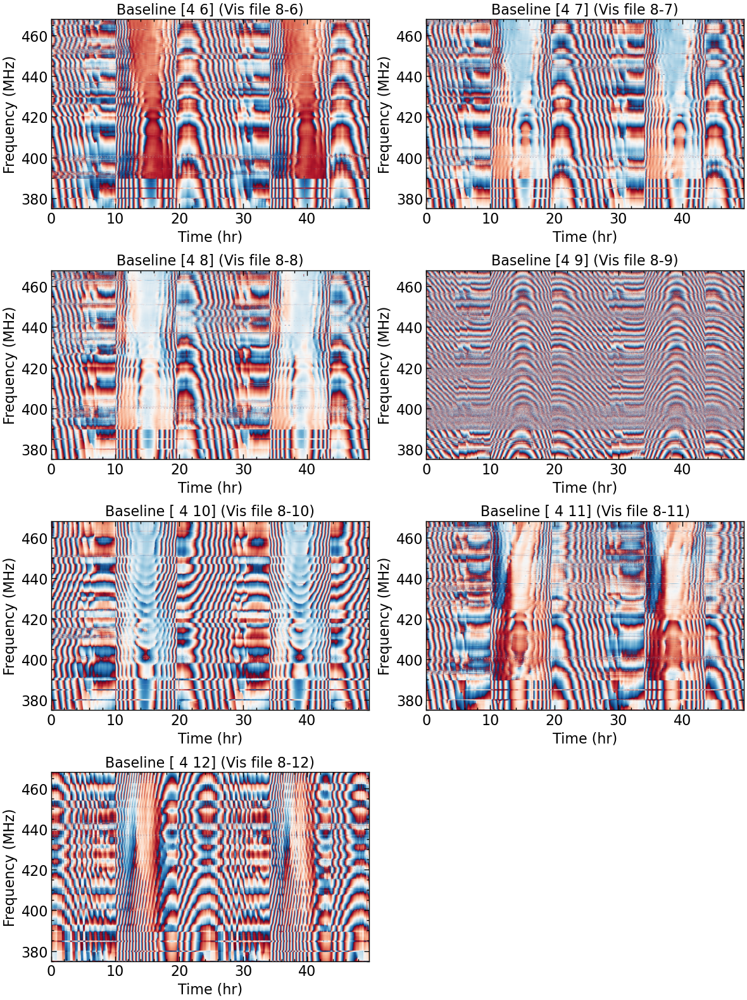

In [23]:
# 1. Increase grid to 4x2 to fit all 7 items
fig, axs = plt.subplots(4, 2, figsize=(12, 16))
axs = axs.flatten()  # Flatten to handle 1D indexing [0, 1, 2, ...]

def path_to_phase_differential(path, f_mhz, f0_mhz=375):
    """
    Phase relative to reference frequency f0.
    """
    f_hz = f_mhz * 1e6
    f0_hz = f0_mhz * 1e6
    phase_diff = 2 * np.pi * path * (f_hz - f0_hz) / 3e8
    return phase_diff

for i, (n, p) in enumerate(zip(ns, ps)):
    # Data extraction
    test_model_vis = mod_vis_interp[:, n, :, 0, 0].T
    model_phase = np.angle(test_model_vis)
    
    # Obs data - using ant 8 and the loop variable p
    test_obs_vis = obs_vis[:, ::-1, 4, p].T
    
    # Apply fringestopping (Conjugate subtraction)
    test_obs_corr = test_obs_vis * np.exp(-1j * model_phase)
    
    # Plotting using the enumeration index 'i' (0, 1, 2...)
    phases = np.unwrap(np.angle(np.mean(test_obs_corr[f_mask,350:450], axis=1)))
    # axs[i].plot(obs_freqs[f_mask], phases)
    sol = np.polyfit(obs_freqs[f_mask]*1e6, phases, 1)
    path = sol[0]*3e8/(2*np.pi)
    delay_phases = path_to_phase_differential(path, obs_freqs, 375)
    delay_phases = np.tile(delay_phases[:, np.newaxis], (1, test_obs_vis.shape[1]))
    delay_correction = np.exp(-1j * delay_phases)
    test_obs_delay_corr = test_obs_corr * delay_correction

    im = axs[i].imshow(
        np.angle(test_obs_delay_corr), 
        aspect='auto', 
        cmap='RdBu', 
        extent=[obs_del_ts[0]/3600, obs_del_ts[-1]/3600, obs_freqs[0], obs_freqs[-1]], 
        vmin=-np.pi,
        vmax=np.pi,
        origin="lower"
    )
    
    axs[i].set_title(f"Baseline {baseline_pairs[n]} (Vis file 8-{p})")
    axs[i].set_xlabel("Time (hr)")
    axs[i].set_ylabel("Frequency (MHz)")

    # axs[i].plot(obs_freqs[f_mask], sol[0]*obs_freqs[f_mask]*1e6 + sol[1])
    
    # axs[i].set_title(f"Path diff {n} {len.round(2)} (Vis file 8-{p})")
    # axs[i].set_xlabel("Time (hr)")
    # axs[i].set_ylabel("Frequency (MHz)")

# 2. Hide the last empty subplot (index 7)
axs[-1].set_visible(False)

plt.tight_layout()
plt.show()
# fig.savefig("fringestopped_delaycal.png")